<a href="https://colab.research.google.com/github/jamesmuiru/mlfccourse/blob/main/Healthcare_Infrastructure_Optimization_in_Central_Kenya_james.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Access data from fynesse

In [2]:
# Remove old repo if it exists
!rm -rf fynesse_template

# Clone fresh
!git clone https://github.com/jamesmuiru/fynesse_template.git

# Navigate into the correct subfolder (adjust if needed)
%cd fynesse_template/fynesse

# Verify files
!ls



Cloning into 'fynesse_template'...
remote: Enumerating objects: 281, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 281 (delta 35), reused 7 (delta 7), pack-reused 224 (from 3)
Receiving objects: 100% (281/281), 171.17 KiB | 937.00 KiB/s, done.
Resolving deltas: 100% (129/129), done.
/content/fynesse_template/fynesse
access.py  address.py  assess.py  config.py  defaults.yml  __init__.py	tests


In [3]:
!head -n 40 /content/fynesse_template/fynesse/access.py


# access.py
import geopandas as gpd
import pandas as pd

class HealthDataLoader:
    def __init__(self, base_path="/content/drive/MyDrive/Miniproject"):
        """
        Initialize the data loader with default paths.
        """
        self.base_path = base_path

        # Define file paths
        self.county_shapefile = f"{base_path}/county_with_raster_means.shp"
        self.gpkg_file = f"{base_path}/county_boundaries.gpkg"
        self.health_facilities_data = f"{base_path}/csvs/facilities_data.csv"
        self.projected_population_2025 = f"{base_path}/csvs/projected_population_2025.csv"
        self.teen_pregnancy_bycounty = f"{base_path}/csvs/teen_pregnacy_dataByCounty.csv"
        self.level2_nurse_facilities = f"{base_path}/csvs/level2_lessthan3nursesfacilities_nurses.csv"
        self.sexual_violence = f"{base_path}/csvs/sexual_violence.csv"

        # Placeholders for loaded data
        self.county_boundaries_df = None
        self.facilities_df = None
        self.proj

## Abstract  

This project explores the optimization of healthcare facilities across **Kenya** by integrating spatial datasets and geospatial analysis. The study begins with the preparation of county-level data, including population density, healthcare facility distribution, distance to the nearest facility, and demographic indicators such as underage pregnancies and insurance coverage. Using **GeoPandas** and **Rasterstats**, the datasets were merged and enhanced with derived metrics such as the total number of facilities, facilities completed or closed, and projected population for 2025.  

Spatial analytics were then performed to measure accessibility gaps, identify regions with low facility density, and compute scarcity percentages. A heatmap was generated to visualize correlations between population pressure, healthcare demand, and facility distribution. The analysis highlights areas where existing infrastructure is insufficient relative to population needs.  

The results demonstrate significant disparities in healthcare access across counties, with certain regions showing **high population density but limited facility coverage**. These insights provide a basis for policymakers to prioritize investments, strategically allocate resources, and plan new healthcare facilities to achieve more equitable service delivery across Kenya.  


## import Libraries for use

In [4]:
pip install osmnx

In [5]:
import pandas as pd
import osmnx
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import k_means
from fynesse_template import fynesse
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# **Access Phase**

## **Access** the data-NB this data has been scrapped from kenya Demographic and health survey records.It involved digitization of pdf documents from the health records

In [8]:
import sys

# Add your repo path to sys.path
sys.path.append("/content/fynesse_template/fynesse")

# Import the HealthDataLoader class
from access import HealthDataLoader

# Initialize loader
loader = HealthDataLoader()

# Load all datasets
loader.load_data()

# Access GeoDataFrame and DataFrames
counties_gdf = loader.get_county_boundaries()
facilities_df = loader.get_facilities()
population_df = loader.get_projected_population()
teen_pregnancy_df = loader.get_teen_pregnancy()
lowstaff_facilities_df = loader.get_low_staff_facilities()
sexual_violence_df = loader.get_sexual_violence()

# --- Quick checks ---
print("Counties GeoDataFrame:", counties_gdf.shape)
print("Facilities DataFrame:", facilities_df.shape)
print("Projected Population DataFrame:", population_df.shape)
print("Teen Pregnancy DataFrame:", teen_pregnancy_df.shape)
print("Low Staff Facilities DataFrame:", lowstaff_facilities_df.shape)
print("Sexual Violence DataFrame:", sexual_violence_df.shape)

# Preview a few rows from each
display(counties_gdf.head())
display(facilities_df.head())
display(population_df.head())
display(teen_pregnancy_df.head())
display(lowstaff_facilities_df.head())
display(sexual_violence_df.head())


Counties GeoDataFrame: (47, 15)
Facilities DataFrame: (47, 5)
Projected Population DataFrame: (47, 2)
Teen Pregnancy DataFrame: (47, 3)
Low Staff Facilities DataFrame: (47, 4)
Sexual Violence DataFrame: (48, 3)


,Shape_Leng,Shape_Area,County,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,Masked_Pop,HealthFac_,geometry
0,5.932315,0.884732,Baringo,KE030,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-1024.192908,0.015759,"MULTIPOLYGON (((35.7839 1.65557, 35.78496 1.65..."
1,2.922220,0.198099,Bomet,KE036,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,447.384376,0.002373,"MULTIPOLYGON (((35.4736 -0.3992, 35.47845 -0.4..."
2,3.062486,0.245058,Bungoma,KE039,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,597.911139,0.005981,"MULTIPOLYGON (((34.62017 1.10228, 34.62133 1.1..."
3,2.670396,0.147178,Busia,KE040,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-6147.432674,0.002850,"MULTIPOLYGON (((34.36097 0.7773, 34.36172 0.77..."
4,3.888933,0.244432,Elgeyo-Marakwet,KE028,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,179.945064,0.007160,"MULTIPOLYGON (((35.69818 1.28225, 35.69788 1.2..."


,County,Target_Facilities,Coverage_Total_Assessed,Facilities_Completed,Facilities_Closed
0,Bomet,206,188,100,6
1,Kericho,286,261,204,24
2,Machakos,494,505,359,48
3,Meru,591,539,432,80
4,Turkana,283,251,218,8


,County,Projected_Population_2025
0,Nairobi,4906000
1,Kiambu,2754000
2,Nakuru,2445000
3,Kakamega,2073000
4,Bungoma,1845000


,County,Have_ever_had_a_pregnancy_loss_(%),Number_of_women
0,Mombasa,1.0,143
1,Kwale,2.9,118
2,Kilifi,1.3,224
3,Tana River,1.4,27
4,Lamu,0.8,24


,County,Total_Level2_Facilities,Facilities_Less_Than_3_Nurses,Percentage_of_scarcity
0,Nairobi,66,28,42.4
1,Mombasa,40,27,67.5
2,Kiambu,81,61,75.3
3,Nakuru,158,127,80.4
4,Bungoma,124,101,81.5


,County,Ever_(%),Number_of_women
0,Mombasa,9.8,500
1,Kwale,4.3,264
2,Kilifi,12.2,491
3,Tana River,2.3,81
4,Lamu,14.5,51


## Feature addition
## 🗂️ Merging Health and Demographic Data into a GeoDataFrame

We use the `HealthDataLoader` class to load multiple datasets (shapefile and CSVs) into memory.  
Then, we apply the `merge_dfs_to_gdf` function to combine all the tabular datasets with the county-level GeoDataFrame using the common key **`County`**.




In [9]:
from access import HealthDataLoader, merge_dfs_to_gdf

loader = HealthDataLoader()
loader.load_data()

processed_gdf = merge_dfs_to_gdf(
    loader.get_county_boundaries(),
    [
        loader.get_facilities(),
        loader.get_projected_population(),
        loader.get_teen_pregnancy(),
        loader.get_low_staff_facilities(),
        loader.get_sexual_violence()
    ],
    key="County"
)


In [10]:
processed_gdf.head()

,Shape_Leng,Shape_Area,County,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,Masked_Pop,HealthFac_,geometry,Target_Facilities,Coverage_Total_Assessed,Facilities_Completed,Facilities_Closed,Projected_Population_2025,Have_ever_had_a_pregnancy_loss_(%),Number_of_women,Total_Level2_Facilities,Facilities_Less_Than_3_Nurses,Percentage_of_scarcity,Ever_(%),Number_of_women_5
0,5.932315,0.884732,Baringo,KE030,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-1024.192908,0.015759,"MULTIPOLYGON (((35.7839 1.65557, 35.78496 1.65...",296.0,306.0,277.0,19.0,764000.0,1.5,86.0,183.0,177.0,96.7,8.4,207.0
1,2.922220,0.198099,Bomet,KE036,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,447.384376,0.002373,"MULTIPOLYGON (((35.4736 -0.3992, 35.47845 -0.4...",206.0,188.0,100.0,6.0,965000.0,1.2,152.0,70.0,62.0,88.6,12.9,369.0
2,3.062486,0.245058,Bungoma,KE039,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,597.911139,0.005981,"MULTIPOLYGON (((34.62017 1.10228, 34.62133 1.1...",283.0,282.0,256.0,13.0,1845000.0,1.8,294.0,124.0,101.0,81.5,30.3,623.0
3,2.670396,0.147178,Busia,KE040,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-6147.432674,0.002850,"MULTIPOLYGON (((34.36097 0.7773, 34.36172 0.77...",188.0,184.0,174.0,0.0,1006000.0,2.9,149.0,74.0,64.0,86.5,14.7,309.0
4,3.888933,0.244432,Elgeyo-Marakwet,KE028,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,179.945064,0.007160,"MULTIPOLYGON (((35.69818 1.28225, 35.69788 1.2...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# **Assess phase**

In [11]:
# Access dataframes from the loader
facilities_df = loader.get_facilities()
projected_population_df = loader.get_projected_population()
teen_pregnancy_df = loader.get_teen_pregnancy()
less_than3_nursefacilities_df = loader.get_low_staff_facilities()
sexual_violence_df = loader.get_sexual_violence()

# Store them in a dictionary for easy iteration
dfs = {
    "facilities_df": facilities_df,
    "projected_population_df": projected_population_df,
    "teen_pregnancy_df": teen_pregnancy_df,
    "less_than3_nursefacilities_df": less_than3_nursefacilities_df,
    "sexual_violence_df": sexual_violence_df,
}

# Debugging check for 'County' column
for name, df in dfs.items():
    if "County" in df.columns:
        print(f"\n{name} - County column found ")
        print("Unique County values (first 5):", df["County"].unique()[:5])
    else:
        print(f"\n{name} - County column  NOT found!")
        print("Columns available:", list(df.columns))



facilities_df - County column found 
Unique County values (first 5): ['Bomet' 'Kericho' 'Machakos' 'Meru' 'Turkana']

projected_population_df - County column found 
Unique County values (first 5): ['Nairobi' 'Kiambu' 'Nakuru' 'Kakamega' 'Bungoma']

teen_pregnancy_df - County column found 
Unique County values (first 5): ['Mombasa' 'Kwale' 'Kilifi' 'Tana River' 'Lamu']

less_than3_nursefacilities_df - County column found 
Unique County values (first 5): ['Nairobi' 'Mombasa' 'Kiambu' 'Nakuru' 'Bungoma']

sexual_violence_df - County column found 
Unique County values (first 5): ['Mombasa' 'Kwale' 'Kilifi' 'Tana River' 'Lamu']


## Standardize county names(cleaning naming convention)

### Renaming counties in every dataframe to enable non null join

In [12]:
from access import HealthDataLoader, merge_dfs_to_gdf
from assess import clean_county_names

# Initialize loader and load raw datasets
loader = HealthDataLoader()
loader.load_data()

# Access individual dataframes
facilities_df = loader.get_facilities()
projected_population_df = loader.get_projected_population()
teen_pregnancy_df = loader.get_teen_pregnancy()
less_than3_nursefacilities_df = loader.get_low_staff_facilities()
sexual_violence_df = loader.get_sexual_violence()

# Apply cleaning to all
facilities_df = clean_county_names(facilities_df)
projected_population_df = clean_county_names(projected_population_df)
teen_pregnancy_df = clean_county_names(teen_pregnancy_df)
less_than3_nursefacilities_df = clean_county_names(less_than3_nursefacilities_df)
sexual_violence_df = clean_county_names(sexual_violence_df)


## reapply merging

In [13]:
# Merge all into one GeoDataFrame
processed_gdf = merge_dfs_to_gdf(
    loader.get_county_boundaries(),
    [facilities_df, projected_population_df, teen_pregnancy_df, less_than3_nursefacilities_df, sexual_violence_df],
    key="County"
)

processed_gdf.head()

,Shape_Leng,Shape_Area,County,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,Masked_Pop,HealthFac_,geometry,Target_Facilities,Coverage_Total_Assessed,Facilities_Completed,Facilities_Closed,Projected_Population_2025,Have_ever_had_a_pregnancy_loss_(%),Number_of_women,Total_Level2_Facilities,Facilities_Less_Than_3_Nurses,Percentage_of_scarcity,Ever_(%),Number_of_women_5
0,5.932315,0.884732,Baringo,KE030,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-1024.192908,0.015759,"MULTIPOLYGON (((35.7839 1.65557, 35.78496 1.65...",296,306,277,19,764000,1.5,86,183,177,96.7,8.4,207
1,2.922220,0.198099,Bomet,KE036,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,447.384376,0.002373,"MULTIPOLYGON (((35.4736 -0.3992, 35.47845 -0.4...",206,188,100,6,965000,1.2,152,70,62,88.6,12.9,369
2,3.062486,0.245058,Bungoma,KE039,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,597.911139,0.005981,"MULTIPOLYGON (((34.62017 1.10228, 34.62133 1.1...",283,282,256,13,1845000,1.8,294,124,101,81.5,30.3,623
3,2.670396,0.147178,Busia,KE040,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-6147.432674,0.002850,"MULTIPOLYGON (((34.36097 0.7773, 34.36172 0.77...",188,184,174,0,1006000,2.9,149,74,64,86.5,14.7,309
4,3.888933,0.244432,Elgeyo-Marakwet,KE028,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,179.945064,0.007160,"MULTIPOLYGON (((35.69818 1.28225, 35.69788 1.2...",147,152,145,6,509000,1.4,32,92,90,97.8,6.9,119


## Column Renaming for Clarity  

To improve readability and ensure consistent naming across the dataset, several columns in the `counties` GeoDataFrame were renamed.  
The renaming focused on:  

- Making column names **more descriptive** (e.g., `HealthFac_` → `Health_Facilities_distance(degrees)`).  
- Ensuring **clarity of meaning** (e.g., `Number_of_women` → `Number_of_women_with_underage_pregnancy`).  
- Standardizing naming conventions to avoid confusion (e.g., `Facilities_Less_Than_3_Nurses` → `LowStaff_Facilities`).  

This step ensures that all subsequent analyses, visualizations, and results use **clear and interpretable labels**, making the outputs easier for both technical and non-technical audiences to understand.


In [14]:
# Rename only specific columns
counties= processed_gdf.copy()
counties = counties.rename(
    columns={
        "HealthFac_": "Health_Facilities_distance",
        "Masked_Pop": "Population_density",
        "Projected_Population_2025": "2025_Projected_Population",
        "Have_ever_had_a_pregnancy_loss_(%)": "Have_ever_had_a_pregnancy_loss",
        "Number_of_women": "Number_of_women_with_underage_pregnancy",
        "Total_Level2_Facilities": "Total_Level2_Facilities",
        "Facilities_Less_Than_3_Nurses": "Facilities_Less_Than_3_Nurses",
        "Percentage_of_scarcity": "Percentage_of_scarcity",
        "Ever_(%)": "Ever_got_underage_pregnancy(%)",
         "Facilities_Less_Than_3_Nurses": "LowStaff_Facilities",
        'Target_Facilities': 'Total_number_of_facilities',
        'Coverage_Total_Assessed': 'insurance_covered_population',
        'Facilities_Closed': 'Facilities_Closed'

    }
)


In [15]:
## assess the data
counties.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 47 entries, 0 to 46
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Shape_Leng                               47 non-null     float64       
 1   Shape_Area                               47 non-null     float64       
 2   County                                   47 non-null     object        
 3   ADM1_PCODE                               47 non-null     object        
 4   ADM1_REF                                 1 non-null      object        
 5   ADM1ALT1EN                               0 non-null      object        
 6   ADM1ALT2EN                               0 non-null      object        
 7   ADM0_EN                                  47 non-null     object        
 8   ADM0_PCODE                               47 non-null     object        
 9   date                                 

In [16]:
x=[x for x in counties.columns]
x

['Shape_Leng',
 'Shape_Area',
 'County',
 'ADM1_PCODE',
 'ADM1_REF',
 'ADM1ALT1EN',
 'ADM1ALT2EN',
 'ADM0_EN',
 'ADM0_PCODE',
 'date',
 'validOn',
 'validTo',
 'Population_density',
 'Health_Facilities_distance',
 'geometry',
 'Total_number_of_facilities',
 'insurance_covered_population',
 'Facilities_Completed',
 'Facilities_Closed',
 '2025_Projected_Population',
 'Have_ever_had_a_pregnancy_loss',
 'Number_of_women_with_underage_pregnancy',
 'Total_Level2_Facilities',
 'LowStaff_Facilities',
 'Percentage_of_scarcity',
 'Ever_got_underage_pregnancy(%)',
 'Number_of_women_5']

## Plot the counties

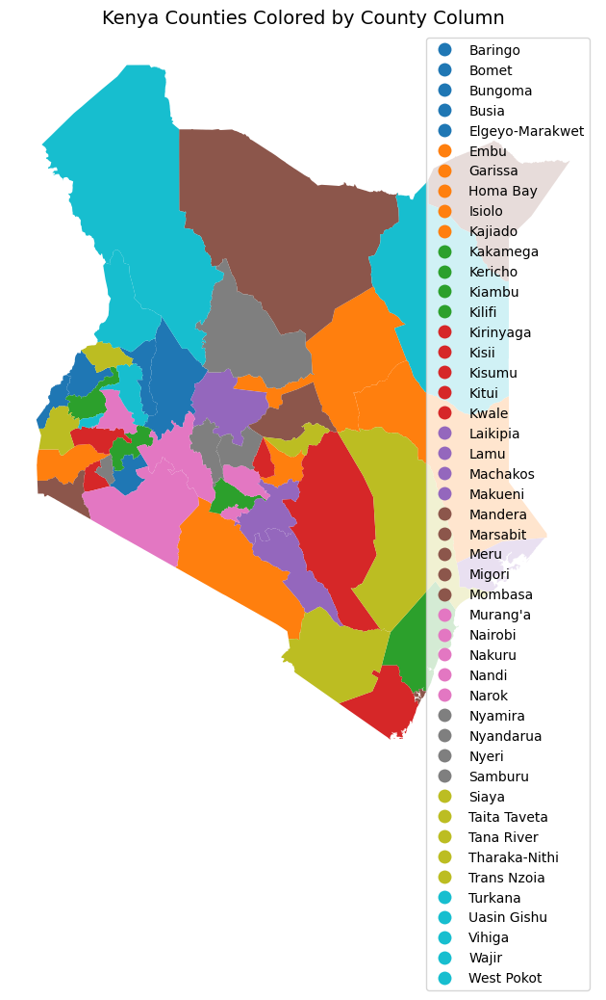

In [17]:


# Plot and color by 'County' column
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 10))
counties.plot(column="County", categorical=True, legend=True, ax=ax)

plt.title("Kenya Counties Colored by County Column", fontsize=14)
plt.axis("off")
plt.show()


## Visualizations


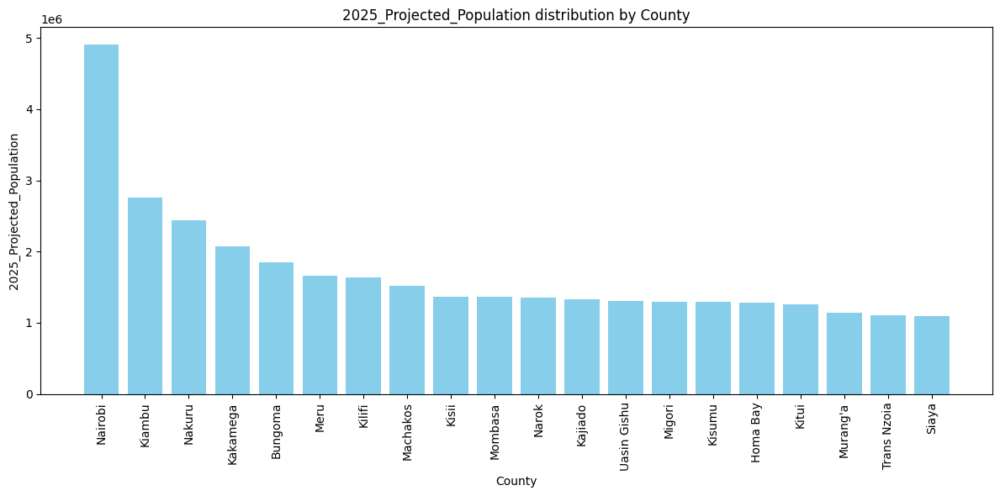

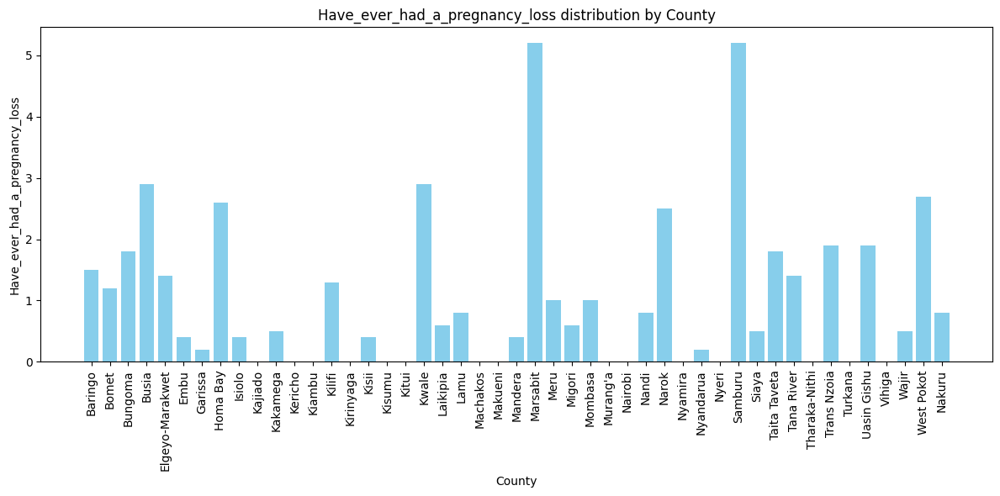

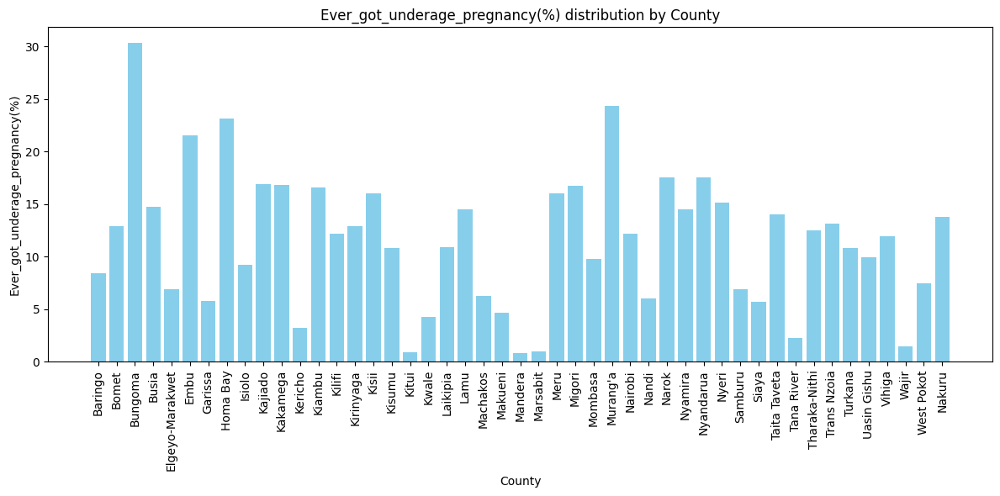

In [18]:
from assess import plot_gdf_column

# Example: Plot population density by county
plot_gdf_column(counties, "2025_Projected_Population", plot_type="bar", top_n=20)

# Example: Histogram of percentage of underage pregnancy by county
plot_gdf_column(counties, "Have_ever_had_a_pregnancy_loss", plot_type="bar")

# Example: Histogram of percentage of underage pregnancy by county
plot_gdf_column(counties, "Ever_got_underage_pregnancy(%)", plot_type="bar")


## Correlation Visualization of County-Level Indicators

The `plot_gdf_correlation` function generates a **correlation heatmap** for numeric columns in a GeoDataFrame containing county-level health and demographic indicators.  

### Features:
- Automatically excludes non-numeric columns such as `County`, `geometry`, `ADM` codes, and date fields.
- Computes Pearson correlation between numeric indicators like:
  - `Population_density`
  - `Health_Facilities_distance`
  - `2025_Projected_Population`
  - `Facilities_Completed`
  - `Facilities_Closed`
  - `Percentage_of_scarcity`
  - And more...
- Plots a clear, annotated heatmap for easy interpretation of relationships between metrics.



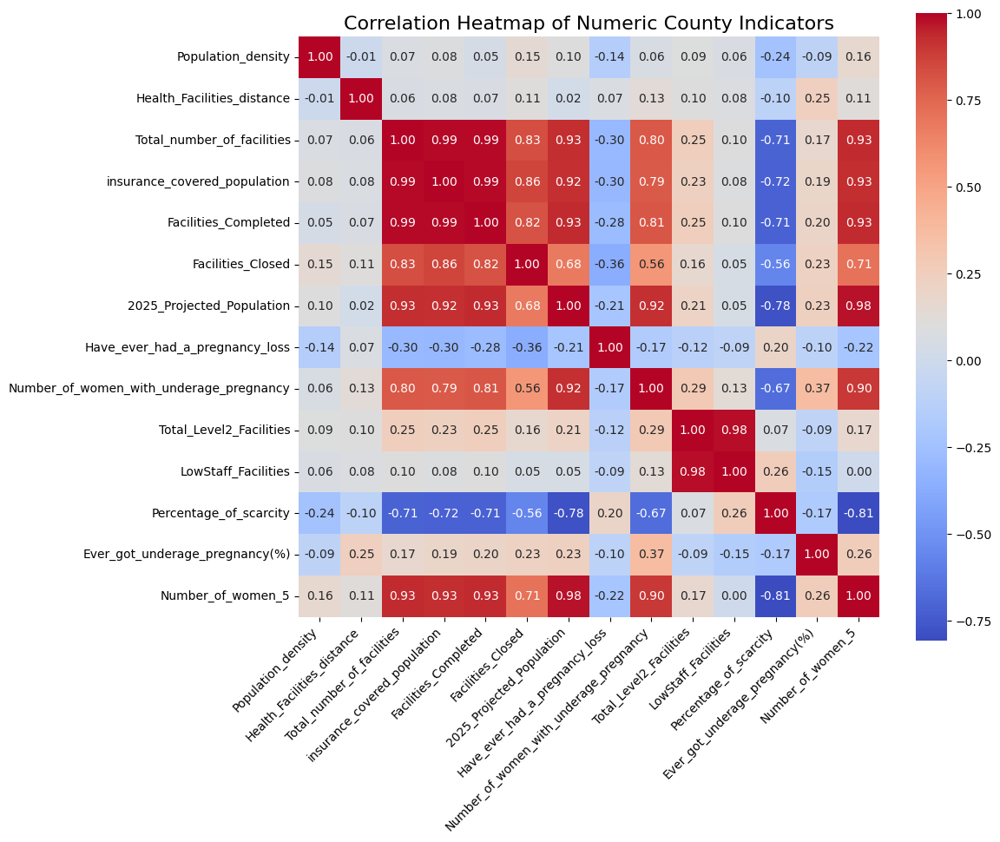

In [19]:
from assess import plot_gdf_correlation

# Generate correlation heatmap
plot_gdf_correlation(counties)


# **ADDRESS Phase**

#  **Health Facility Placement Optimization Pipeline**
This notebook demonstrates a workflow for optimizing health facility placement using a GeoDataFrame of Kenyan counties.  
It integrates demographic, health, and infrastructure indicators into a **priority score**, applies **clustering**, and recommends the **number of new facilities** needed.


## Final Notes
After running this pipeline:
- The GeoDataFrame `counties` includes:
  - `Priority_Score`  
  - `Cluster`  
  - `Suggested_New_Facilities`  

- Outputs:
  - `summary`: table of results for all counties.  
  - `top_recommendations`: top 10 counties by priority.  
  - `cluster_stats`: average indicators per cluster.  

This workflow provides both **quantitative** and **spatial** insights for evidence-based health facility planning.


        County  2025_Projected_Population  Total_number_of_facilities  \
0      Mandera                    1007000                         216   
1      Bungoma                    1845000                         283   
2        Narok                    1355000                         221   
3     Kakamega                    2073000                         362   
4        Busia                    1006000                         188   
5  Trans Nzoia                    1108000                         195   
6        Kisii                    1370000                         296   
7     Homa Bay                    1278000                         406   
8        Bomet                     965000                         206   
9        Kwale                     988000                         232   

   Facility_Ratio  Priority_Score  Cluster  Suggested_New_Facilities  \
0     4640.552995        1.000000        2                         0   
1     6496.478873        0.977860        0          

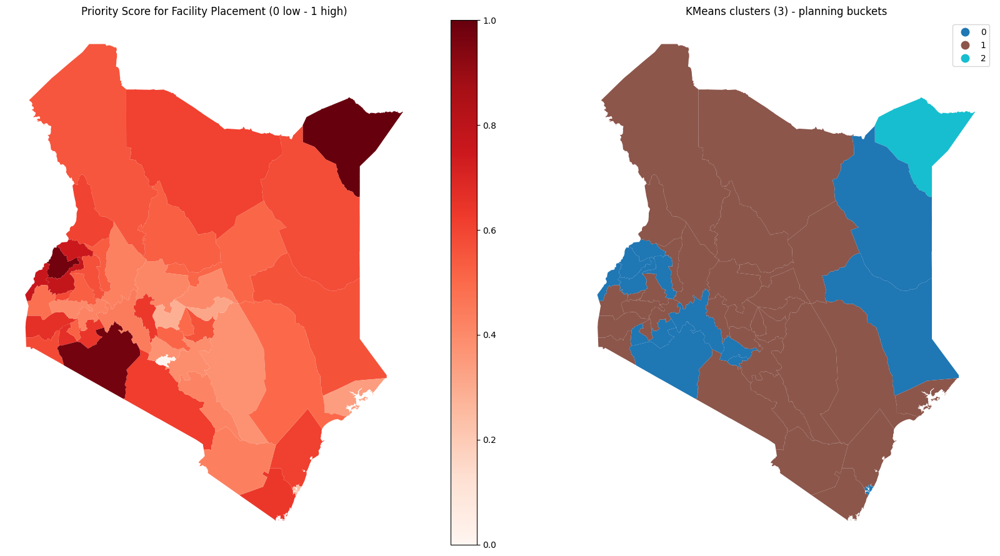

In [32]:
from address import HealthFacilityOptimizer

# Initialize with your GeoDataFrame (already merged/cleaned)
optimizer = HealthFacilityOptimizer(counties)

# Run preprocessing
optimizer.preprocess()

# Normalize and compute priority scores
optimizer.normalize_and_score()

# Cluster counties
optimizer.cluster_counties(n_clusters=3)

# Suggest new facilities
optimizer.suggest_new_facilities(people_per_facility=30000)

# View summary of top 10 priority counties
summary = optimizer.get_summary(top_n=10)
print(summary)

# Plot results
optimizer.plot_priority()


## Health Facility Optimization Pipeline
This notebook demonstrates step-by-step analysis of Kenyan counties for health facility planning using the `HealthFacilityOptimizer` class which is based on kmeans clustering and weighting.


### Step 1: Initialize optimizer

In [37]:
# import the optimizer from address.py
from address import HealthFacilityOptimizer
# Step 1: Initialize optimizer
optimizer = HealthFacilityOptimizer(counties)



### Step 2: Preprocessing
- Numeric columns are coerced
- Missing values are filled with sensible defaults
- Derived indicators are calculated:
  - Facility_Ratio
  - Accessibility
  - Scarcity
  - Vulnerability_raw
  - LowStaff_Ratio


In [39]:
# Step 2: Preprocess data
optimizer.preprocess()
# Check first 5 rows after preprocessing
optimizer.counties.head()


,Shape_Leng,Shape_Area,County,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,Population_density,Health_Facilities_distance,geometry,Total_number_of_facilities,insurance_covered_population,Facilities_Completed,Facilities_Closed,2025_Projected_Population,Have_ever_had_a_pregnancy_loss,Number_of_women_with_underage_pregnancy,Total_Level2_Facilities,LowStaff_Facilities,Percentage_of_scarcity,Ever_got_underage_pregnancy(%),Number_of_women_5,Facility_Ratio,Accessibility,Scarcity,Vulnerability_raw,LowStaff_Ratio,Priority_Score,Cluster,Suggested_New_Facilities
0,5.932315,0.884732,Baringo,KE030,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-1024.192908,0.015759,"MULTIPOLYGON (((35.7839 1.65557, 35.78496 1.65...",296,306,277,19,764000,1.5,86,183,177,96.7,8.4,207,2572.390572,0.984485,96.7,2.554638,0.961957,0.428936,1,0
1,2.922220,0.198099,Bomet,KE036,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,447.384376,0.002373,"MULTIPOLYGON (((35.4736 -0.3992, 35.47845 -0.4...",206,188,100,6,965000,1.2,152,70,62,88.6,12.9,369,4661.835749,0.997632,88.6,3.303577,0.873239,0.642083,0,0
2,3.062486,0.245058,Bungoma,KE039,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,597.911139,0.005981,"MULTIPOLYGON (((34.62017 1.10228, 34.62133 1.1...",283,282,256,13,1845000,1.8,294,124,101,81.5,30.3,623,6496.478873,0.994055,81.5,7.101573,0.808000,0.977860,0,0
3,2.670396,0.147178,Busia,KE040,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,-6147.432674,0.002850,"MULTIPOLYGON (((34.36097 0.7773, 34.36172 0.77...",188,184,174,0,1006000,2.9,149,74,64,86.5,14.7,309,5322.751323,0.997158,86.5,4.534660,0.853333,0.761152,0,0
4,3.888933,0.244432,Elgeyo-Marakwet,KE028,None,None,None,Kenya,KE,2017-11-03,2019-10-31,NaT,179.945064,0.007160,"MULTIPOLYGON (((35.69818 1.28225, 35.69788 1.2...",147,152,145,6,509000,1.4,32,92,90,97.8,6.9,119,3439.189189,0.992891,97.8,2.160672,0.967742,0.531314,1,0


### Step 3: Normalization and Priority Score
- Normalizes key indicators using MinMaxScaler
- Computes a composite `Priority_Score` combining:
  - Facility availability
  - Accessibility
  - Scarcity
  - Vulnerability
  - Low staff ratio


In [41]:
# Step 3: Normalize and compute priority scores
optimizer.normalize_and_score()
# Inspect priority scores
optimizer.counties[['County','Priority_Score']].sort_values('Priority_Score', ascending=False).head(10)


,County,Priority_Score
23,Mandera,1.000000
2,Bungoma,0.977860
31,Narok,0.976318
10,Kakamega,0.776977
3,Busia,0.761152
40,Trans Nzoia,0.748351
15,Kisii,0.664773
7,Homa Bay,0.663073
1,Bomet,0.642083
18,Kwale,0.637766


### Step 4: Clustering
- Uses KMeans clustering on normalized priority features
- Groups counties into 3 planning clusters
- Helps identify counties with similar needs


In [43]:
# Step 4: Cluster counties
optimizer.cluster_counties(n_clusters=3)
# View cluster assignment counts
optimizer.counties['Cluster'].value_counts()


,count
Cluster,
1,32
0,14
2,1


### Step 5: Suggested New Facilities
- Calculates additional facilities needed per county
- Based on a target of 30,000 people per facility


In [60]:
# Step 5: Suggested new facilities(people_per_facility changes with number you desire to be served)
optimizer.suggest_new_facilities(people_per_facility=30000)
# View suggested facilities
optimizer.counties[['County','Total_number_of_facilities','Suggested_New_Facilities']].head(10)




,County,Total_number_of_facilities,Suggested_New_Facilities
0,Baringo,296,0
1,Bomet,206,0
2,Bungoma,283,0
3,Busia,188,0
4,Elgeyo-Marakwet,147,0
5,Embu,211,0
6,Garissa,206,0
7,Homa Bay,406,0
8,Isiolo,82,0
9,Kajiado,352,0


### Step 6: Top 10 Priority Counties
Shows counties ranked by `Priority_Score`, including:
- Projected population (2025)
- Current total facilities
- Facility ratio
- Cluster assignment
- Suggested new facilities


In [56]:
# Step 6: Summary of top counties
summary = optimizer.get_summary(top_n=10)
summary


,County,2025_Projected_Population,Total_number_of_facilities,Facility_Ratio,Priority_Score,Cluster,Suggested_New_Facilities,Scarcity,LowStaff_Ratio
0,Mandera,1007000,216,4640.552995,1.000000,2,1798,96.8,0.952381
1,Bungoma,1845000,283,6496.478873,0.977860,0,3407,81.5,0.808000
2,Narok,1355000,221,6103.603604,0.976318,0,2489,95.8,0.944444
3,Kakamega,2073000,362,5710.743802,0.776977,0,3784,86.4,0.857143
4,Busia,1006000,188,5322.751323,0.761152,0,1824,86.5,0.853333
5,Trans Nzoia,1108000,195,5653.061224,0.748351,0,2021,84.7,0.833333
6,Kisii,1370000,296,4612.794613,0.664773,0,2444,90.4,0.892857
7,Homa Bay,1278000,406,3140.049140,0.663073,1,2150,100.0,0.916667
8,Bomet,965000,206,4661.835749,0.642083,0,1724,88.6,0.873239
9,Kwale,988000,232,4240.343348,0.637766,1,1744,96.5,0.958333


## Step 7: Visualizations
- Left: Priority Score choropleth (0 low → 1 high)
- Right: KMeans cluster map (3 clusters)
- Optional: Interactive Plotly map showing detailed county metrics


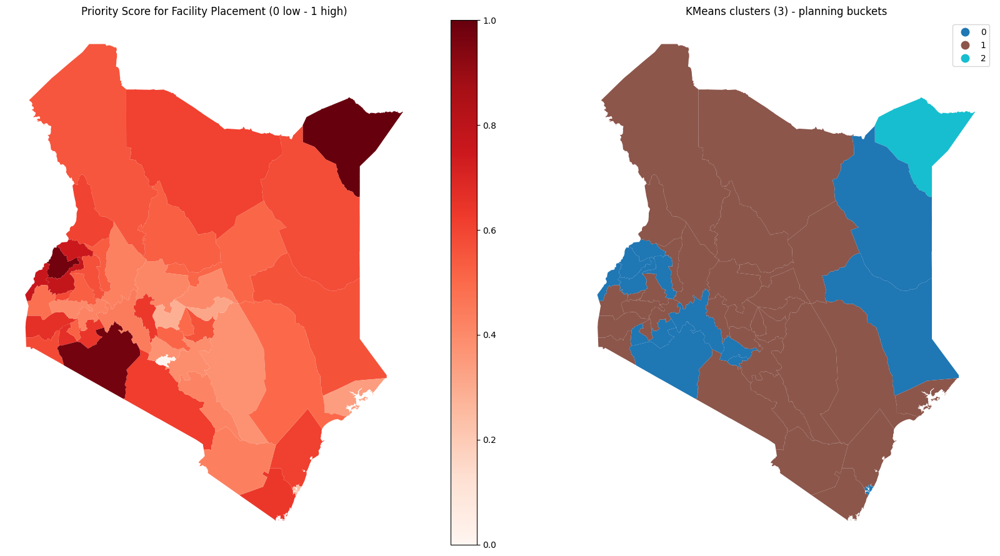

In [57]:
# Step 7: Visualizations
optimizer.plot_priority()
